# Sentinel-2 L2A <img align="right" src="../../resources/csiro_easi_logo.png">

#### Index
- [Overview](#Overview)
- [Setup (imports, defaults, dask)](#Setup)
- [Example query](#Example-query)
- [Product definition](#Product-definition)
- [Quality layer](#Quality-layer)
- [Create and apply a good quality pixel mask](#Create-and-apply-a-good-quality-pixel-mask)
- [Plot and browse the data](#Plot-and-browse-the-data)
- [Perform cloud statistics] (#Statistics)

## Overview

Sentinel-2 is an Earth observation mission from the EU Copernicus Programme that systematically acquires optical imagery at high spatial resolution (up to 10 m for some bands). The mission is a constellation of two identical satellites in the same orbit, 180° apart for optimal coverage and data delivery. Together, they cover all Earth's land surfaces, large islands, inland and coastal waters every 3-5 days.

Sentinel-2A was launched on 23 June 2015 and Sentinel-2B followed on 7 March 2017.
Both of the Sentinel-2 satellites carry a wide swath high-resolution multispectral imager with 13 spectral bands.
For more information see:
- [ESA Sentinel missions](https://www.esa.int/Applications/Observing_the_Earth/Copernicus/The_Sentinel_missions)
- [Sentinel-2 technical specifications](https://sentinels.copernicus.eu/web/sentinel/technical-guides/sentinel-2-msi)

_Selected text adapted from https://github.com/GeoscienceAustralia/dea-notebooks/blob/develop/DEA_datasets/Sentinel_2.ipynb_

#### Data source and documentation

ESA produces a surface reflectance "S2 Collection 1 L2A" product using their [sen2cor](https://step.esa.int/main/snap-supported-plugins/sen2cor/) software. [Element84](https://www.element84.com/) convert these data to Cloud-Optimized Geotiff format and makes them publicly available in an [AWS open data repository](https://registry.opendata.aws/sentinel-2-l2a-cogs/) with a [STAC API](https://stacspec.org) for programmatic access.

Starting in January 2024, ESA is reprocessing Sentinel-2 to a ["Collection 1"](https://sentinels.copernicus.eu/web/sentinel/sentinel-data-access/sentinel-products/sentinel-2-data-products/collection-1-level-2a) product. Element-84 are similarly processing these data to COGs.

EASI uses its STAC indexing tools to index datasets into our ODC databases.

| Name | Product | Source | Information | Index
|--|--|--|--|--|
| Sentinel-2 C1 L2A COGs | `sentinel_2_c1_l2a` | [Earthsearch STAC](https://earth-search.aws.element84.com/v1) | Use for global (land) surface reflectance | Select COGS via STAC and convert to ODC metadata

## Setup

#### Imports

In [1]:
# Basic plots
%matplotlib inline
import matplotlib.pyplot as plt
# plt.rcParams['figure.figsize'] = [12, 8]

# Common imports and settings
import os, sys
os.environ['USE_PYGEOS'] = '0'
from IPython.display import Markdown
import pandas as pd
pd.set_option("display.max_rows", None)
import xarray as xr

# Datacube
import datacube
from datacube.utils.rio import configure_s3_access
import odc.geo.xr                                  # https://github.com/opendatacube/odc-geo
from datacube.utils import masking  # https://github.com/opendatacube/datacube-core/blob/develop/datacube/utils/masking.py
from odc.algo import enum_to_bool                  # https://github.com/opendatacube/odc-tools/blob/develop/libs/algo/odc/algo/_masking.py
from dea_tools.plotting import display_map, rgb    # https://github.com/GeoscienceAustralia/dea-notebooks/tree/develop/Tools

# Holoviews, Datashader and Bokeh
import hvplot.pandas
import hvplot.xarray
import panel as pn
import colorcet as cc
import cartopy.crs as ccrs
from datashader import reductions
from holoviews import opts
# hv.extension('bokeh', logo=False)

### Data tools
import numpy as np
import pandas as pd

# Dask
from dask.distributed import Client, LocalCluster

# EASI defaults
import git
repo = git.Repo('.', search_parent_directories=True)
if repo.working_tree_dir not in sys.path: sys.path.append(repo.working_tree_dir)

repo = '/home/jovyan/easi-notebooks/easi-notebooks'
if repo not in sys.path: sys.path.append(repo)
from easi_tools import EasiDefaults
from easi_tools.notebook_utils import mostcommon_crs, initialize_dask, localcluster_dashboard, heading
from easi_tools.load_s2l2a import load_s2l2a_with_offset

#### EASI defaults

These default values are configured for each EASI instance. They help us to use the same training notebooks in each EASI instance. You may find some of the functions convenient for your work or you can easily override the values in your copy of this notebook.

In [2]:
easi = EasiDefaults()

family = 'sentinel-2'
product = 'sentinel_2_c1_l2a'
display(Markdown(f'Default {family} product for "{easi.name}": [{product}]({easi.explorer}/products/{product})'))

Successfully found configuration for deployment "asia"


Default sentinel-2 product for "asia": [sentinel_2_c1_l2a](https://explorer.asia.easi-eo.solutions/products/sentinel_2_c1_l2a)

#### Dask cluster

Its nearly always worth starting a dask cluster as it can improve data load and processing speed.

In [3]:
# Local cluster

cluster = LocalCluster(n_workers=2, threads_per_worker=4)
client = Client(cluster)
display(client)

dashboard_address = localcluster_dashboard(client=client,server=easi.hub)
display(dashboard_address)

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 8,Total memory: 24.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40855,Workers: 2
Dashboard: http://127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 24.00 GiB
Comm: tcp://127.0.0.1:36525,Total threads: 4
Dashboard: http://127.0.0.1:40519/status,Memory: 12.00 GiB
Nanny: tcp://127.0.0.1:35227,


'https://hub.asia.easi-eo.solutions/user/pen227/proxy/8787/status'

#### ODC database

Connect to the ODC database. Configure the environment and low-level tools to read from AWS buckets.

In [4]:
dc = datacube.Datacube()

# Access AWS "requester-pays" buckets
# This is necessary for reading data from most third-party AWS S3 buckets such as for Landsat and Sentinel-2
configure_s3_access(aws_unsigned=False, requester_pays=True, client=client);

## Example query

Change any of the parameters in the `query` object below to adjust the location, time, projection, or spatial resolution of the returned datasets.

Use the Explorer interface to check the temporal and spatial coverage for each product:

In [5]:
# Default area of interest

display(Markdown(f'#### Location: Khulna, Bangladesh'))
display(Markdown(f'See: {easi.explorer}/products/{product}'))

latitude_range = 22.75, 22.85
longitude_range = 89.5, 89.6
time_range = ('2020-05-01', '2020-08-01')

# Or set your own latitude / longitude
# latitude_range = (21.5, 23.5)
# longitude_range = (88, 90.8)
# time_range = ('2022-01-01', '2022-03-01')

query = {
    'product': product,       # Product name
    'x': longitude_range,     # "x" axis bounds
    'y': latitude_range,      # "y" axis bounds
    'time': time_range,       # Any parsable date strings
}

# Convenience function to display the selected area of interest
display_map(longitude_range, latitude_range)

#### Location: Khulna, Bangladesh

See: https://explorer.asia.easi-eo.solutions/products/sentinel_2_c1_l2a

#### Most common CRS

Sentinel-2 datasets are stored with different coordinate reference systems (CRS), corresponding to the multiple UTM zones that are used for S2 L1B tiling. S2 measurement bands also have different resolutions (10 m, 20 m and 60 m). As such S2 queries need to include the following two query parameters:

* `output_crs` - This sets a consistent CRS that all Sentinel-2 data will be reprojected to, irrespective of the UTM zone the individual image is stored in.
* `resolution` - This sets the resolution that all Sentinel-2 images will be resampled to. 

Use `mostcommon_crs()` to select a CRS. Adapted from https://github.com/GeoscienceAustralia/dea-notebooks/blob/develop/Tools/dea_tools/datahandling.py

In [6]:
# Most common CRS
native_crs = mostcommon_crs(dc, query)
print(f'Most common native CRS: {native_crs}')

# Target xarray parameters
# - Select a set of measurements to load
# - output CRS and resolution
# - Usually we group input scenes on the same day to a single time layer (groupby)
# - Select a reasonable Dask chunk size (this should be adjusted depending on the
#   spatial and resolution parameters you choose
load_params = {
    'measurements': ['blue', 'red', 'green', 'nir', 'scl'],  # Selected measurement or alias names
    'output_crs': native_crs,                       # Target EPSG code
    'resolution': (-20, 20),                        # Target resolution
    'group_by': 'solar_day',                        # Scene grouping
    'dask_chunks': {'x': 2048, 'y': 2048},          # Dask chunks
}

Most common native CRS: EPSG:32645


In [7]:
# Load data

data = dc.load(**(query | load_params))
display(data)

<xarray.Dataset>
Dimensions:      (time: 36, y: 564, x: 524)
Coordinates:
  * time         (time) datetime64[ns] 2020-05-01T04:42:12.300000 ... 2020-07...
  * y            (y) float64 2.529e+06 2.529e+06 ... 2.518e+06 2.518e+06
  * x            (x) float64 7.566e+05 7.566e+05 7.566e+05 ... 7.67e+05 7.67e+05
    spatial_ref  int32 32645
Data variables:
    blue         (time, y, x) uint16 dask.array<chunksize=(1, 564, 524), meta=np.ndarray>
    red          (time, y, x) uint16 dask.array<chunksize=(1, 564, 524), meta=np.ndarray>
    green        (time, y, x) uint16 dask.array<chunksize=(1, 564, 524), meta=np.ndarray>
    nir          (time, y, x) uint16 dask.array<chunksize=(1, 564, 524), meta=np.ndarray>
    scl          (time, y, x) uint8 dask.array<chunksize=(1, 564, 524), meta=np.ndarray>
Attributes:
    crs:           EPSG:32645
    grid_mapping:  spatial_ref

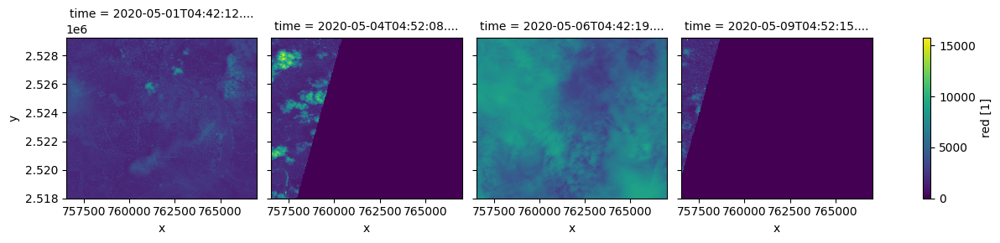

In [8]:
# Optional

# Create a simple plot to verify that the data look reasonable
# This will load and create images from the data which may take a few minutes
# Here we limit ths plot to the first few time layers.

data.isel(time=slice(0,4)).red.plot.imshow(col="time")

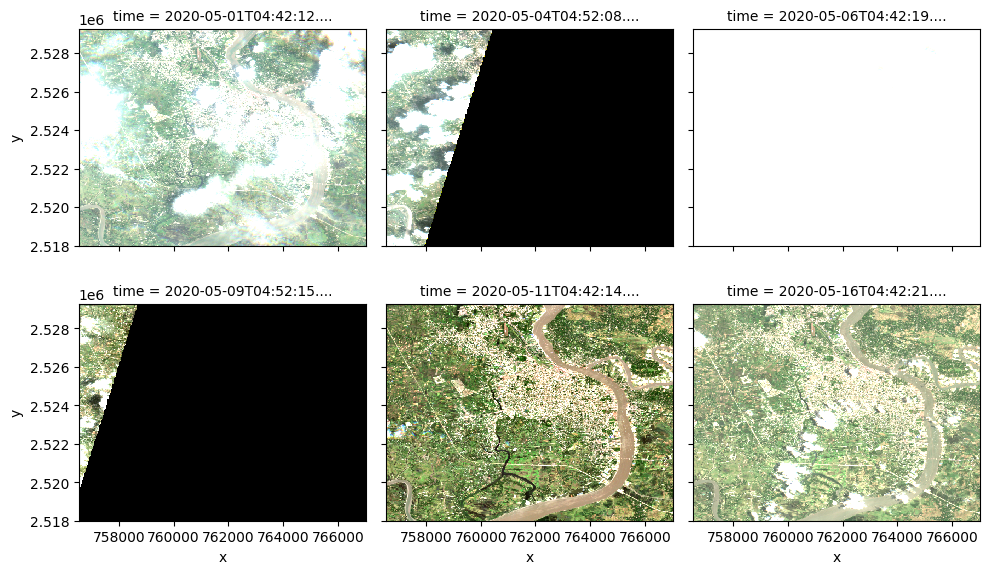

In [9]:
### True-colour display
image_array = data[['red', 'green', 'blue']].isel(time=range(6)).to_array()
image_array.plot.imshow(vmin=800, vmax=2500, col='time', col_wrap=3) # vmin and vmax is deliberately used here instead of robust=True, because the clouds make the images very dark

## Product definition

The product definition contains details on the measurements and quality layers available in the product. Datacube provides convenience functions that return this information in `pandas DataFrames`.

Use `list_measurements` to show the details for a product, and `masking.describe_variable_flags` to show the flag definitions.

In [10]:
# Measurement definitions for the selected product
measurement_info = dc.list_measurements().loc[query['product']]
heading(f'Measurement table for product: {query["product"]}')
display(measurement_info)

# Flag definitions
flag_name = 'scl'
heading(f'Flag definition table for flag name: {flag_name}')
display(masking.describe_variable_flags(data[flag_name]))

flags_def = masking.describe_variable_flags(data[flag_name]).loc['qa']['values']
display(flags_def)

,name,dtype,units,nodata,flags_definition,aliases,add_offset,scale_factor
measurement,,,,,,,,
coastal,coastal,uint16,1,0.0,NaN,"[band_01, B01, coastal_aerosol]",-0.1,0.0001
blue,blue,uint16,1,0.0,NaN,"[band_02, B02]",-0.1,0.0001
green,green,uint16,1,0.0,NaN,"[band_03, B03]",-0.1,0.0001
red,red,uint16,1,0.0,NaN,"[band_04, B04]",-0.1,0.0001
rededge1,rededge1,uint16,1,0.0,NaN,"[band_05, B05, red_edge_1]",-0.1,0.0001
rededge2,rededge2,uint16,1,0.0,NaN,"[band_06, B06, red_edge_2]",-0.1,0.0001
rededge3,rededge3,uint16,1,0.0,NaN,"[band_07, B07, red_edge_3]",-0.1,0.0001
nir,nir,uint16,1,0.0,NaN,"[band_08, B08, nir_1]",-0.1,0.0001
nir08,nir08,uint16,1,0.0,NaN,"[band_8a, B8A, nir_2]",-0.1,0.0001


,bits,values,description
qa,"[0, 1, 2, 3, 4, 5, 6, 7]","{'0': 'no data', '1': 'saturated or defective'...",Sen2Cor Scene Classification


{'0': 'no data',
 '1': 'saturated or defective',
 '2': 'topographic and casted shadow',
 '3': 'cloud shadows',
 '4': 'vegetation',
 '5': 'not vegetated',
 '6': 'water',
 '7': 'unclassified',
 '8': 'cloud medium probability',
 '9': 'cloud high probability',
 '10': 'thin cirrus',
 '11': 'snow or ice'}

#### Apply the correct _offset_ to the source data

ESA introduced a change to their L1C processing that encodes their L1C and L2A products with _scale_ and _offset_ value such that
`phyiscal_value = encoded_value * scale_factor + offset`. The scale and offset details per band are available in the product definition.

In [11]:
# Apply scale and offset

for vv in data.data_vars:
    scale = measurement_info.loc[vv,'scale_factor']
    offset = measurement_info.loc[vv,'add_offset']
    if not pd.isnull(scale) and not pd.isnull(offset):
        data[vv] = data[vv] * scale + offset

## Quality layer

To visualise the **SCL** layer we use `hvplot` to create a dynamic (zoom, scroll) image with a colour map that corresponds to that used by ESA.

In [12]:
# Make SCL image
# https://sentinel.esa.int/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm
# https://www.sentinel-hub.com/faq/how-get-s2a-scene-classification-sentinel-2/

from bokeh.models.tickers import FixedTicker

color_def = [
    (0,  '#000000', 'No data'),   # black
    (1,  '#ff0004', 'Saturated or defective'),   # red
    (2,  '#868686', 'Topographic and casted shadow'),   # gray
    (3,  '#774c0b', 'Cloud shadows'),   # brown
    (4,  '#10d32d', 'Vegetation'),   # green
    (5,  '#ffff53', 'Not vegetated'),   # yellow
    (6,  '#0000ff', 'Water'),   # blue
    (7,  '#818181', 'Unclassified'),   # medium gray
    (8,  '#c0c0c0', 'Cloud medium probability'),   # light gray
    (9,  '#f2f2f2', 'Cloud high probability'),   # very light gray
    (10, '#bbc5ec', 'Thin cirrus'),   # light blue/purple
    (11, '#53fff9', 'Snow or ice'),   # cyan
]
color_val = [x[0] for x in color_def]
color_hex = [x[1] for x in color_def]
color_txt = [f'{x[0]:2d}: {x[2]}' for x in color_def]
color_lim = (min(color_val), max(color_val) + 1)
bin_edges = color_val + [max(color_val) + 1]
bin_range = (color_val[0] + 0.5, color_val[-1] + 0.5)  # No idea why (0.5,11.5) works and (0,11) or (0,12) do not

# These options manipulate the color map and colorbar to show the categories for this product
options = {
    'title': f'Flag data for: {query["product"]} ({flag_name})',
    'cmap': color_hex,
    'clim': color_lim,
    'color_levels': bin_edges,
    'colorbar': True,
    'width': 800,
    'height': 450,
    'aspect': 'equal',
    'tools': ['hover'],
    'colorbar_opts': {
        'major_label_overrides': dict(zip(color_val, color_txt)),
        'major_label_text_align': 'left',
        'ticker': FixedTicker(ticks=color_val),
    },
}

# Set the Dataset CRS
plot_crs = native_crs
if plot_crs == 'epsg:4326':
    plot_crs = ccrs.PlateCarree()


# Native data and coastline overlay:
# - Comment `crs`, `projection`, `coastline` to plot in native_crs coords
# TODO: Update the axis labels to 'longitude', 'latitude' if `coastline` is used

quality_plot = data[flag_name].hvplot.image(
    x = 'x', y = 'y',                        # Dataset x,y dimension names
    rasterize = True,                        # Use Datashader
    aggregator = reductions.mode(),          # Datashader selects mode value, requires 'hv.Image'
    precompute = True,                       # Datashader precomputes what it can
    # crs = plot_crs,                          # Datset crs
    # projection = ccrs.PlateCarree(),         # Output projection (ccrs.PlateCarree() when coastline=True)
    # coastline = '10m',                       # Coastline = '10m'/'50m'/'110m'
).options(opts.Image(**options)).hist(bin_range = bin_range)

# display(quality_plot)
# Optional: Change the default time slider to a dropdown list, https://stackoverflow.com/a/54912917
fig = pn.panel(quality_plot, widgets={'time': pn.widgets.Select})  # widget_location='top_left'
fig

Row
    [0] HoloViews(AdjointLayout, widgets={'time': <class '...})
    [1] WidgetBox(align=('end', 'start'))
        [0] Select(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-05-01 ...]), value=numpy.datetime64('2020-05-..., width=250)

## Create and apply a good quality pixel mask

Select a set of flag values that represent "good quality" for your application. Here we select "vegetation", "not vegetated" and "water"; that is we exclude clouds and low-quality features.

The **SCL** layer uses distinct integer values to represent each class. The datacube `enum_to_bool()` function creates a boolean mask layer corresponding to a set of category values (string names).

Recall that *scale* and *offset* (if required) have already been applied by the `load_s2l2a_with_offset()` function.

In [13]:
# Create Mask layer

good_pixel_flags = [flags_def[str(i)] for i in [4, 5, 6]]

good_pixel_mask = enum_to_bool(data[flag_name], good_pixel_flags)
display(good_pixel_mask)  # -> DataArray. Type: bool


# Apply good pixel mask (multiple layers)
good_data = data.where(good_pixel_mask).persist()

<xarray.DataArray 'enum_to_bool-afb12368-21bb4520ce9d07870eb3a3a24a00e3ad' (
                                                                            time: 36,
                                                                            y: 564,
                                                                            x: 524)>
dask.array<enum_to_bool-afb12368, shape=(36, 564, 524), dtype=bool, chunksize=(1, 564, 524), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 2020-05-01T04:42:12.300000 ... 2020-07...
  * y            (y) float64 2.529e+06 2.529e+06 ... 2.518e+06 2.518e+06
  * x            (x) float64 7.566e+05 7.566e+05 7.566e+05 ... 7.67e+05 7.67e+05
    spatial_ref  int32 32645
Attributes:
    units:         1
    crs:           EPSG:32645
    grid_mapping:  spatial_ref

## Plot and browse the data

There are numerous tools we can use to plot and interact with the data. Here we use `hvplot` again because it works well with dask and allows us to zoom and scroll quite efficiently. `Hvplot` uses [Datashader](https://datashader.org/getting_started/Pipeline.html) to process and render only the pixels that are required for the viewport.

Various options can be changed such as the data layer, colour map and colour range.

In [14]:
# Generate a plot

options = {
    'title': f'{query["product"]}',
    'width': 800,
    'height': 450,
    'aspect': 'equal',
    'cmap': cc.rainbow,
    'clim': (0, 1),                          # Limit the color range depending on the layer_name
    'colorbar': True,
    'tools': ['hover'],
}

# Set the Dataset CRS
plot_crs = native_crs
if plot_crs == 'epsg:4326':
    plot_crs = ccrs.PlateCarree()


# Native data and coastline overlay:
# - Comment `crs`, `projection`, `coastline` to plot in native_crs coords
# TODO: Update the axis labels to 'longitude', 'latitude' if `coastline` is used

layer_plot = good_data[['nir']].hvplot.image(
    x = 'x', y = 'y',                        # Dataset x,y dimension names
    rasterize = True,                        # Use Datashader
    aggregator = reductions.mean(),          # Datashader selects mean value
    precompute = True,                       # Datashader precomputes what it can
    # crs = plot_crs,                        # Dataset crs
    # projection = ccrs.PlateCarree(),         # Output projection (use ccrs.PlateCarree() when coastline=True)
    # coastline='10m',                         # Coastline = '10m'/'50m'/'110m'
).options(opts.Image(**options)).hist(bin_range = options['clim'])

# display(layer_plot)
# Optional: Change the default time slider to a dropdown list, https://stackoverflow.com/a/54912917
fig = pn.panel(layer_plot, widgets={'time': pn.widgets.Select})  # widget_location='top_left'
display(fig)

Row
    [0] HoloViews(AdjointLayout, widgets={'time': <class '...})
    [1] WidgetBox(align=('end', 'start'))
        [0] Select(margin=(20, 20, 20, 20), name='time', options=OrderedDict([('2020-05-01 ...]), value=numpy.datetime64('2020-05-..., width=250)

---
We can now plot the first six masks in the `good pixel mask` time series.

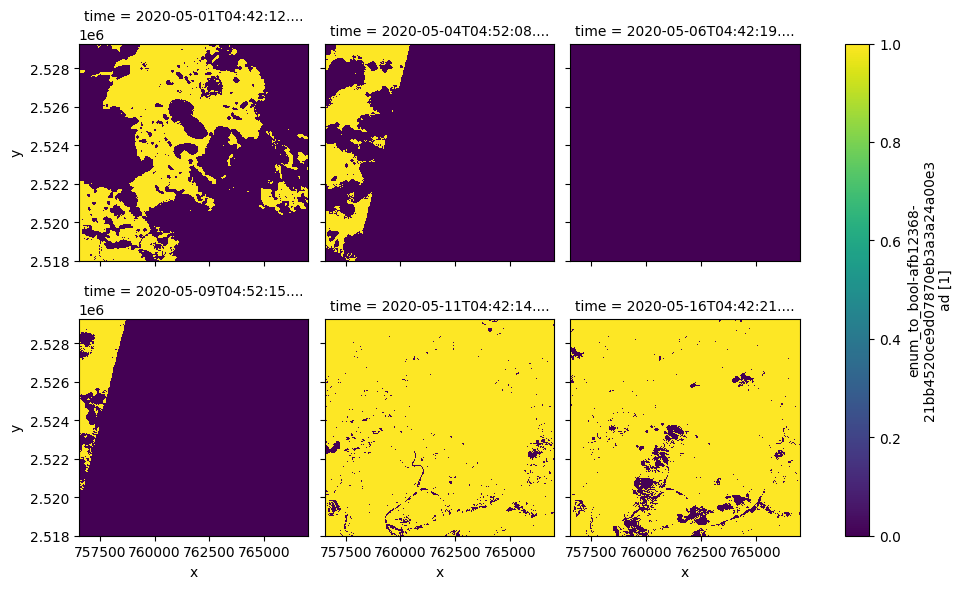

In [15]:
good_pixel_mask[:6].plot(col='time', col_wrap=3) # Note that these are just the first 6 dates

## Valid pixel mask

Based on the **SCL** quality flag , we can also derive a mask of valid observations for each time slice, identifying those pixels not affected by clouds, cloud shadows, etc. Because such phenomena simultaneously affect all bands in the dataset, there will only be one such mask per time slice (for all measurements).

In [16]:
# Create Mask layer

valid_pixel_flags = [flags_def[str(i)] for i in [1,2,3,4,5,6,7,8,9,10,11]]

valid_pixel_mask = enum_to_bool(data[flag_name], valid_pixel_flags)
display(valid_pixel_mask)  # -> DataArray. Type: bool


# Apply good pixel mask (multiple layers)
valid_data = data.where(valid_pixel_mask).persist()

<xarray.DataArray 'enum_to_bool-acdf58d9-b118e9f588358ee8373d1959bceecba7' (
                                                                            time: 36,
                                                                            y: 564,
                                                                            x: 524)>
dask.array<enum_to_bool-acdf58d9, shape=(36, 564, 524), dtype=bool, chunksize=(1, 564, 524), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 2020-05-01T04:42:12.300000 ... 2020-07...
  * y            (y) float64 2.529e+06 2.529e+06 ... 2.518e+06 2.518e+06
  * x            (x) float64 7.566e+05 7.566e+05 7.566e+05 ... 7.67e+05 7.67e+05
    spatial_ref  int32 32645
Attributes:
    units:         1
    crs:           EPSG:32645
    grid_mapping:  spatial_ref

---
We can now plot the first six masks in the `valid pixel mask` time series.

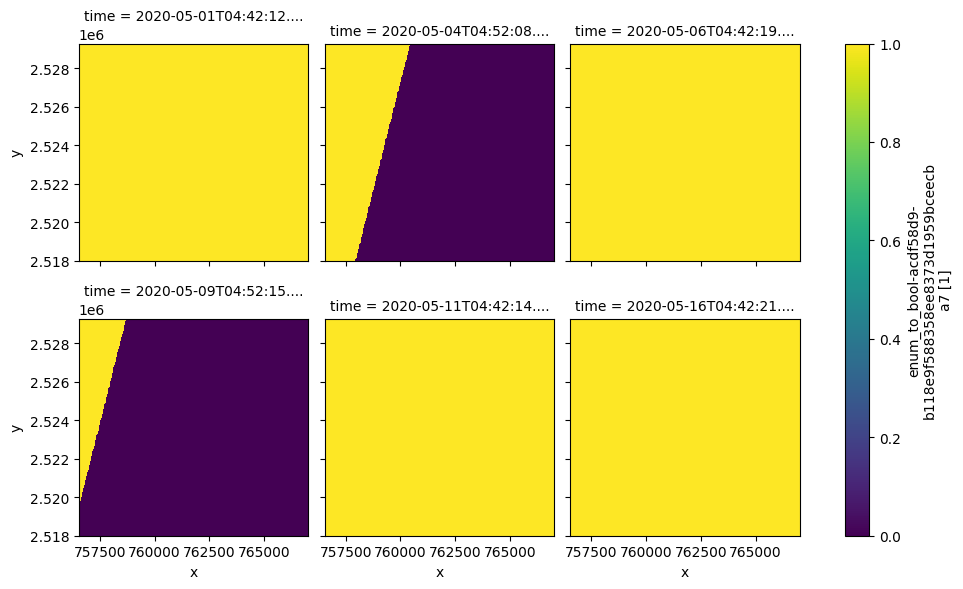

In [17]:
valid_pixel_mask[:6].plot(col='time', col_wrap=3) # Note that these are just the first 6 dates

## Statistics

Based on these datasets derived from the raw Sentinel-2 imagery, we can now calculate some statistics of interest that can be potentially used to inform further analyses of the data.

## Tabular results for each date

For each time slice in the time series, we can calculate the percentage of valid pixels, i.e. the sum of all valid pixels (all values which are not `nodata` values) divided by the total number of pixels in the image. Because each valid pixel is represented by a value of `1.0` in the `valid_mask` object (and a value of `0.0` otherwise), we can simply use the `mean` function to implement this operation. The same can be done for the percentage of clear pixels (i.e. not affected by clouds, shadows, nodata, etc.).

Note that these values represent the percentage of clear (respectively valid) pixels as a proportion of the _total number of pixels over the whole imaging region_, as opposed to the clear percentage representing the fraction of clear pixels _as a percentage of valid pixels_. 

And because clear pixels are a subset of valid pixel, the clear pixel percentage (for each image, as well as overall) should always be lower than the valid pixel percentage.

In [18]:
### Valid pixel percentage in each time slice
count_valid = valid_pixel_mask.sum(dim=['x','y']).values
percentage_valid = np.round( valid_pixel_mask.mean(dim=['x','y']).values*100.0, 2)

### Clear pixel percentage in each time slice
count_clear = good_pixel_mask.sum(dim=['x','y']).values
percentage_clear = np.round( good_pixel_mask.mean(dim=['x','y']).values*100.0, 2)

### Tabular results
tmp = {"date": data.time.values,
       "valid_count": count_valid, 
       "valid_percentage": percentage_valid,
       "clear_count": count_clear, 
       "clear_percentage": percentage_clear }
valid_DF = pd.DataFrame(data=tmp)
valid_DF

,date,valid_count,valid_percentage,clear_count,clear_percentage
0,2020-05-01 04:42:12.300,295536,100.00,109034,36.89
1,2020-05-04 04:52:08.456,75031,25.39,37936,12.84
2,2020-05-06 04:42:19.924,295536,100.00,0,0.00
3,2020-05-09 04:52:15.790,26454,8.95,19026,6.44
4,2020-05-11 04:42:14.556,295536,100.00,286501,96.94
5,2020-05-16 04:42:21.201,295536,100.00,276299,93.49
6,2020-05-19 04:52:16.923,23768,8.04,0,0.00
7,2020-05-21 04:42:16.305,295536,100.00,0,0.00
8,2020-05-24 04:52:12.175,52286,17.69,10020,3.39
9,2020-05-26 04:42:22.034,295536,100.00,7505,2.54


## Time series plot

The table above contains the numeric results related to the metrics of interest (clear and valid pixel percentages). We can also show these same results in a time series plot, where the percentages are displayed in a bar plot with different colours.

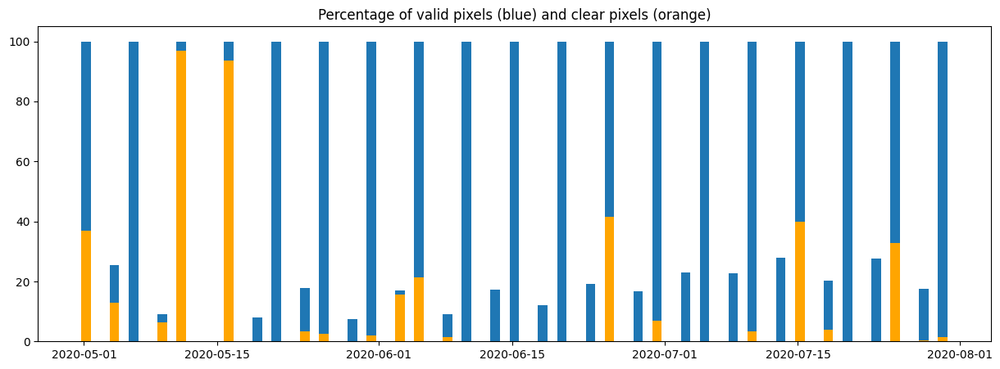

In [19]:
plt.figure(figsize=(15,5))
plt.bar(valid_DF["date"].values, valid_DF["valid_percentage"].values, 1.0)
plt.bar(valid_DF["date"].values, valid_DF["clear_percentage"].values, 1.0, color='orange')
plt.title("Percentage of valid pixels (blue) and clear pixels (orange)");

## Spatial plot of clear pixel percentage

Finally, we can also plot of overall percentage of clear observations (this time, as a _fraction of valid observations_) for each pixel over the whole time series. The result is a map indicating which regions are more or less affected by data quality issues, and thus providing information on whether subsequent analyses might be affected by the lack of clear observations in certain areas.

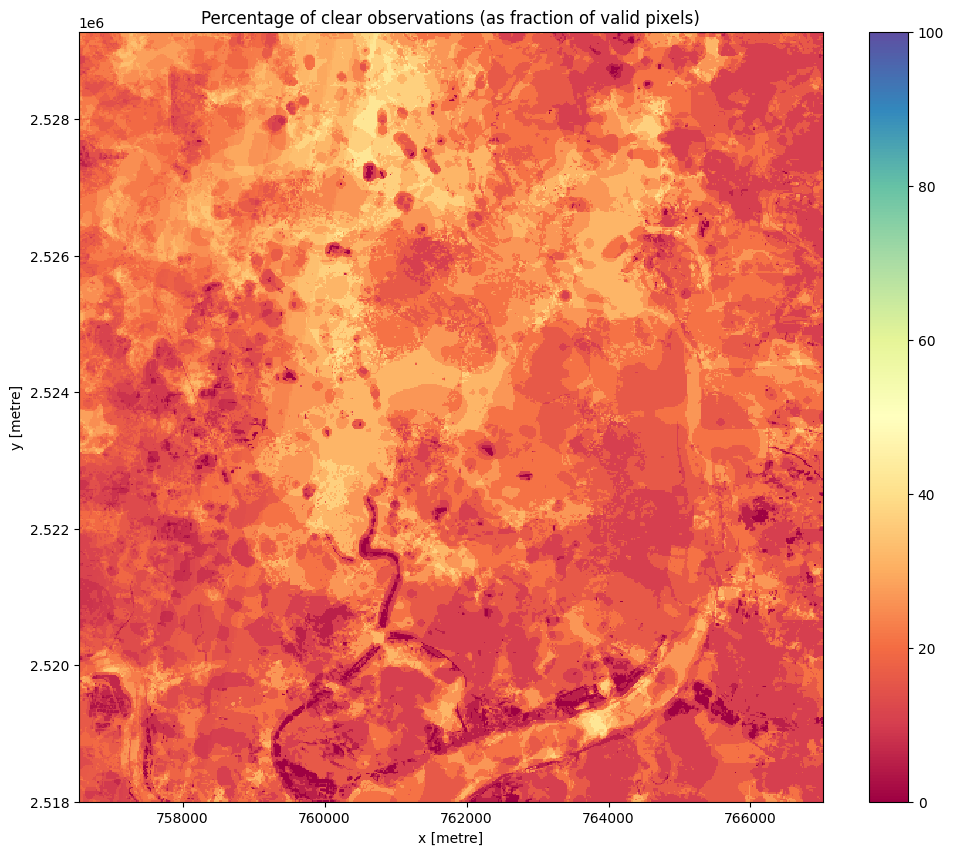

In [20]:
### Valid & clear pixel counts (temporal aggregation)
valid_sum = valid_pixel_mask.sum(dim='time')
clear_sum = good_pixel_mask.sum(dim='time')

### Fraction of clear pixels to valid pixels
percentage_clear = 100.0 * clear_sum / valid_sum
percentage_clear = percentage_clear.where(percentage_clear<=100.0)   # remove some potential data glitches...
percentage_clear = percentage_clear.persist()

percentage_clear.plot(figsize=(12,10), cmap="Spectral", vmin=0, vmax=100)
plt.title('Percentage of clear observations (as fraction of valid pixels)');

---
It is also possible to use Holoviews to produce an interactive plot of this data:

In [21]:
# Holoviews, Datashader and Bokeh
import holoviews as hv
import panel as pn
import cartopy.crs as ccrs
from datashader import reductions
from holoviews import opts
# import geoviews as gv
from holoviews.operation.datashader import rasterize
hv.extension('bokeh', logo=False)

In [22]:
options = {
    'title': 'Percentage of clear observations (as fraction of valid pixels)',
    'width': 800,
    'height': 800,
    'aspect': 'equal',
    'cmap': 'Spectral',
    'clim': (0, 100),                          # Limit the color range depending on the layer_name
    'colorbar': True,
    'tools': ['hover'],
}
    
percentage_clear.hvplot.image(
    x = 'x', y = 'y',                        # Dataset x,y dimension names
    rasterize = True,                        # Use Datashader
    # aggregator = reductions.mean(),        # Datashader selects mean value
    precompute = True,                       # Datashader precomputes what it can
    crs = native_crs,                        # Dataset crs
    projection = ccrs.PlateCarree(),         # Output projection (use ccrs.PlateCarree() when coastline=True)
    coastline='10m',                         # Coastline = '10m'/'50m'/'110m'
).options(opts.Image(**options)).hist(bin_range = options['clim'])

:AdjointLayout
   :DynamicMap   []
      :Overlay
         .Image.I     :Image   [x,y]   (value)
         .Coastline.I :Feature   [Longitude,Latitude]
   :DynamicMap   []
      :Histogram   [value]   (value_count)

Further overall (whole-of-time-series) statistics can also be provided as follows.

In [23]:
print("Overall percentage of valid pixels: {:.2%}".format(valid_pixel_mask.mean().values))
print("Overall percentage of clear pixels: {:.2%}".format(good_pixel_mask.mean().values))

Overall percentage of valid pixels: 61.06%
Overall percentage of clear pixels: 11.76%


In [24]:
print("Number of scenes which have no clear data:", np.sum((good_pixel_mask.mean(dim=['x','y']).values==0)))
print("Number of pixels which have no clear data:", (percentage_clear==0).sum().values)
print("Total number of pixels in each time slice:", data.dims['x']*data.dims['y'])

Number of scenes which have no clear data: 14
Number of pixels which have no clear data: 2984
Total number of pixels in each time slice: 295536
